# IFEWs

Notebook for acquiring, preparing and posting the data

*Author: Julia Brittes Tuthill*
*Date Start: June 21, 2022*
*Last Change: April 10, 2023*

*Project: IFEWs Visualization - Animal, Crop and Nrate data, Ns calculation*
## Setup
# Import necessary libraries

In [1]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from shapely.geometry import mapping
import rioxarray as rxr
import xarray as xr
import geopandas as gpd
import geojson


import earthpy as et
import earthpy.plot as ep
import rasterio
from rasterio.plot import show
from rasterstats import zonal_stats
import pandas as pd

import plotly.express as px
import plotly.graph_objects as go
import ipywidgets as widgets
from scipy.interpolate import interp1d
from IPython.display import display
from ipywidgets import Dropdown

# Prettier plotting with seaborn
sns.set(font_scale=1.5)

# Create environment variables
from dotenv import load_dotenv
load_dotenv()

True

## Get Data
### USDA
##### This section of the notebook refers to the IFEW acquiring of data from USDA Quickstats
Project Part: Query Learning USDA QuickStats API
<span style='color:Red'> Make this section auto updatable yearly. </span>

See Quick Stats (NASS) API user guide:  https://quickstats.nass.usda.gov/api

Workflow of this section is illustraded below:
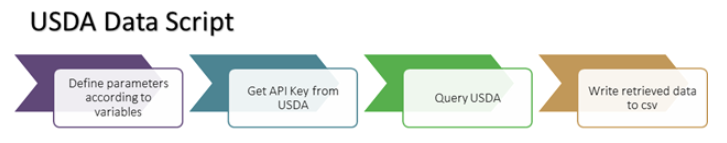

In [83]:
import urllib.request
from requests.utils import requote_uri
import os

parent_dir = os.getcwd()
directory = 'USDA_files'
path = os.path.join(parent_dir, directory)

API_key = os.getenv('API_KEY')

In [ ]:
class c_usda_quick_stats:

    def __init__(self):

        # Set the USDA QuickStats API key, API base URL, and output file path where CSV files will be written. 

        self.api_key = API_key

        self.base_url_api_get = 'http://quickstats.nass.usda.gov/api/api_GET/?key=' + self.api_key + '&'

        self.output_file_path = path

    def get_data(self, parameters, file_name):

        # Call the api_GET api with the specified parameters. 
        # Write the CSV data to the specified output file.

        # Create the full URL and retrieve the data from the Quick Stats server.
        
        full_url = self.base_url_api_get + parameters
        s_result = urllib.request.urlopen(full_url)
        s_text = s_result.read().decode('utf-8')

        # Create the output file and write the CSV data records to the file.

        s_file_name = self.output_file_path + "\\" + file_name + ".csv"
        o_file = open(s_file_name, "w", encoding="utf8")
        o_file.write(s_text)
        o_file.close()      

### Crop Data

In [ ]:
#Corn Grain Yield Bu/Acre
parameters1 =    'source_desc=SURVEY' +  \
                '&sector_desc=CROPS' + \
                '&commodity_desc=CORN' + \
                '&statisticcat_desc=YIELD' + \
                '&util_practice_desc=GRAIN' + \
                '&' + urllib.parse.quote('short_desc=CORN, GRAIN - YIELD, MEASURED IN BU / ACRE') + \
                '&freq_desc=ANNUAL' + \
                '&reference_period_desc=YEAR' + \
                '&year__GE=1997' + \
                '&agg_level_desc=COUNTY' + \
                '&state_name=IOWA' + \
                '&county_code__LT=998' + \
                '&format=CSV'

#Soybean Yield Bu/Acre
parameters2 =    'source_desc=SURVEY' +  \
                '&sector_desc=CROPS' + \
                '&commodity_desc=SOYBEANS' + \
                '&statisticcat_desc=YIELD' + \
                '&' + urllib.parse.quote('short_desc=SOYBEANS - YIELD, MEASURED IN BU / ACRE') + \
                '&freq_desc=ANNUAL' + \
                '&reference_period_desc=YEAR' + \
                '&year__GE=1997' + \
                '&agg_level_desc=COUNTY' + \
                '&state_name=IOWA' + \
                '&format=CSV'

#Corn Silage Yield Tons/Acre
parameters3 =    'source_desc=SURVEY' +  \
                '&sector_desc=CROPS' + \
                '&commodity_desc=CORN' + \
                '&statisticcat_desc=YIELD' + \
                '&util_practice_desc=SILAGE' + \
                '&' + urllib.parse.quote('short_desc=CORN, SILAGE - YIELD, MEASURED IN TONS / ACRE') + \
                '&freq_desc=ANNUAL' + \
                '&reference_period_desc=YEAR' + \
                '&year__GE=1997' + \
                '&agg_level_desc=COUNTY' + \
                '&state_name=IOWA' + \
                '&county_code__LT=998' + \
                '&format=CSV'

#Corn Area Planted Acres
parameters4 =    'source_desc=SURVEY' +  \
                '&sector_desc=CROPS' + \
                '&commodity_desc=CORN' + \
                '&statisticcat_desc__LIKE=PLANTED' + \
                '&' + urllib.parse.quote('short_desc=CORN - ACRES PLANTED') + \
                '&unit_desc=ACRES' + \
                '&freq_desc=ANNUAL' + \
                '&reference_period_desc=YEAR' + \
                '&year__GE=1997' + \
                '&agg_level_desc=COUNTY' + \
                '&state_name=IOWA' + \
                '&county_code__LT=998' + \
                '&format=CSV'

#Corn Area Harvested Acres (grain)
parameters50 =    'source_desc=SURVEY' +  \
                '&sector_desc=CROPS' + \
                '&commodity_desc=CORN' + \
                '&util_practice_desc=GRAIN' + \
                '&statisticcat_desc__LIKE=HARVESTED' + \
                '&' + urllib.parse.quote('short_desc=CORN, GRAIN - ACRES HARVESTED') + \
                '&unit_desc=ACRES' + \
                '&freq_desc=ANNUAL' + \
                '&reference_period_desc=YEAR' + \
                '&year__GE=1997' + \
                '&agg_level_desc=COUNTY' + \
                '&state_name=IOWA' + \
                '&county_code__LT=998' + \
                '&format=CSV'

#Corn Area Harvested Acres (silage)
parameters51 =    'source_desc=SURVEY' +  \
                '&sector_desc=CROPS' + \
                '&commodity_desc=CORN' + \
                '&util_practice_desc=SILAGE' + \
                '&statisticcat_desc__LIKE=HARVESTED' + \
                '&' + urllib.parse.quote('short_desc=CORN, SILAGE - ACRES HARVESTED') + \
                '&unit_desc=ACRES' + \
                '&freq_desc=ANNUAL' + \
                '&reference_period_desc=YEAR' + \
                '&year__GE=1997' + \
                '&agg_level_desc=COUNTY' + \
                '&state_name=IOWA' + \
                '&county_code__LT=998' + \
                '&format=CSV'

#Soybean Area Planted Acres
parameters6 =    'source_desc=SURVEY' +  \
                '&sector_desc=CROPS' + \
                '&' + urllib.parse.quote('group_desc=FIELD CROPS') + \
                '&commodity_desc=SOYBEANS' + \
                '&statisticcat_desc__LIKE=PLANTED' + \
                '&' + urllib.parse.quote('short_desc=SOYBEANS - ACRES PLANTED') + \
                '&unit_desc=ACRES' + \
                '&freq_desc=ANNUAL' + \
                '&reference_period_desc=YEAR' + \
                '&year__GE=1997' + \
                '&agg_level_desc=COUNTY' + \
                '&state_name=IOWA' + \
                '&county_code__LT=998' + \
                '&format=CSV'

#Soybean Area Harvested Acres
parameters7 =    'source_desc=SURVEY' +  \
                '&sector_desc=CROPS' + \
                '&' + urllib.parse.quote('group_desc=FIELD CROPS') + \
                '&commodity_desc=SOYBEANS' + \
                '&statisticcat_desc__LIKE=HARVESTED' + \
                '&' + urllib.parse.quote('short_desc=SOYBEANS - ACRES PLANTED') + \
                '&unit_desc=ACRES' + \
                '&freq_desc=ANNUAL' + \
                '&reference_period_desc=YEAR' + \
                '&year__GE=1997' + \
                '&agg_level_desc=COUNTY' + \
                '&state_name=IOWA' + \
                '&county_code__LT=998' + \
                '&format=CSV'

### Animal Data

In [ ]:
# Live Population of Hogs
parameters8 =    'source_desc=CENSUS' +  \
                '&' + urllib.parse.quote('sector_desc=ANIMALS & PRODUCTS') + \
                '&group_desc=LIVESTOCK' + \
                '&commodity_desc=HOGS' + \
                '&class_desc__LIKE=CLASSES' + \
                '&prodn_practice_desc__NOT_LIKE=CONTRACT' + \
                '&statisticcat_desc=INVENTORY' + \
                '&statisticcat_desc__NE=SALES' + \
                '&' + urllib.parse.quote('short_desc__LIKE=HOGS - INVENTORY') + \
                '&unit_desc=HEAD' + \
                '&domain_desc=TOTAL' + \
                '&' + urllib.parse.quote('freq_desc=POINT IN TIME') + \
                '&' + urllib.parse.quote('reference_period_desc=END OF DEC') + \
                '&year__GE=1997' + \
                '&agg_level_desc=COUNTY' + \
                '&state_name=IOWA' + \
                '&county_code__LT=998' + \
                '&format=CSV'

# Live Population of Beef Cows
parameters9 =    'source_desc=CENSUS' +  \
                '&' + urllib.parse.quote('sector_desc=ANIMALS & PRODUCTS') + \
                '&group_desc=LIVESTOCK' + \
                '&commodity_desc=CATTLE' + \
                '&class_desc__LIKE=BEEF' + \
                '&statisticcat_desc=INVENTORY' + \
                '&domain_desc=TOTAL' + \
                '&' + urllib.parse.quote('domaincat_desc=NOT SPECIFIED') + \
                '&unit_desc=HEAD' + \
                '&year__GE=1997' + \
                '&agg_level_desc=COUNTY' + \
                '&state_name=IOWA' + \
                '&county_code__LT=998' + \
                '&format=CSV'

# Live Population of Milk Cows
parameters10 =    'source_desc=CENSUS' +  \
                '&' + urllib.parse.quote('sector_desc=ANIMALS & PRODUCTS') + \
                '&group_desc=LIVESTOCK' + \
                '&commodity_desc=CATTLE' + \
                '&class_desc__LIKE=MILK' + \
                '&statisticcat_desc=INVENTORY' + \
                '&domain_desc=TOTAL' + \
                '&' + urllib.parse.quote('domaincat_desc=NOT SPECIFIED') + \
                '&unit_desc=HEAD' + \
                '&year__GE=1997' + \
                '&agg_level_desc=COUNTY' + \
                '&state_name=IOWA' + \
                '&county_code__LT=998' + \
                '&format=CSV'

# Live Population of Other Cattle (excl cows)
parameters11 =    'source_desc=CENSUS' +  \
                '&' + urllib.parse.quote('sector_desc=ANIMALS & PRODUCTS') + \
                '&group_desc=LIVESTOCK' + \
                '&commodity_desc=CATTLE' + \
                '&class_desc__LIKE=EXCL' + \
                '&class_desc__LIKE=COWS' + \
                '&statisticcat_desc=INVENTORY' + \
                '&domain_desc=TOTAL' + \
                '&' + urllib.parse.quote('domaincat_desc=NOT SPECIFIED') + \
                '&unit_desc=HEAD' + \
                '&year__GE=1997' + \
                '&agg_level_desc=COUNTY' + \
                '&state_name=IOWA' + \
                '&county_code__LT=998' + \
                '&format=CSV'

# Slaughtered Population Hogs
parameters12 =    'source_desc=SURVEY' +  \
                '&' + urllib.parse.quote('sector_desc=ANIMALS & PRODUCTS') + \
                '&group_desc=LIVESTOCK' + \
                '&commodity_desc=HOGS' + \
                '&class_desc__LIKE=ALL' + \
                '&util_practice_desc__LIKE=SLAUGHTER'+ \
                '&domain_desc=TOTAL' + \
                '&reference_period_desc=YEAR' + \
                '&year__GE=1997' + \
                '&agg_level_desc=STATE' + \
                '&state_name=IOWA' + \
                '&format=CSV'

# Slaughtered Population Cattle - NO DIFFERENTIATION BETWEEN BULLS, CALVES, COWS, WEIGHT, HEIFERS AND STEERS - look into this
parameters13 =    'source_desc=SURVEY' +  \
                '&' + urllib.parse.quote('sector_desc=ANIMALS & PRODUCTS') + \
                '&group_desc=LIVESTOCK' + \
                '&commodity_desc=CATTLE' + \
                '&util_practice_desc__LIKE=SLAUGHTER'+ \
                '&domain_desc=TOTAL' + \
                '&reference_period_desc=YEAR' + \
                '&year__GE=1997' + \
                '&agg_level_desc=STATE' + \
                '&state_name=IOWA' + \
                '&format=CSV'

# Slaughtered Population Poultry Slaughtered in LB live basis
parameters14 =    'source_desc=SURVEY' +  \
                '&' + urllib.parse.quote('sector_desc=ANIMALS & PRODUCTS') + \
                '&group_desc=POULTRY' + \
                '&commodity_desc__LIKE=TOTALS' + \
                '&statisticcat_desc=SLAUGHTERED'+ \
                '&domain_desc=TOTAL' + \
                '&reference_period_desc=YEAR' + \
                '&year__GE=1997' + \
                '&agg_level_desc=NATIONAL' + \
                '&format=CSV'

#### Loop through all parameters

In [ ]:
parameters = [parameters1, parameters2, parameters3, parameters4, parameters50, parameters51, parameters6, parameters7, parameters8, parameters9, parameters10, parameters11, parameters12, parameters13, parameters14]

# create a list of file names - should be 15 total
names_csv = ['corn_grain_yield_buperacre_counties_ifew_ge1997', 'soybeans_yield_buperacre_counties_ifew_ge1997','corn_silage_yield_tonsperacre_counties_ifew_ge1997','corn_area_planted_acres_counties_ifew_ge1997','corn_grain_area_harvested_acres_counties_ifew_ge1997', 'corn_silage_area_harvested_acres_counties_ifew_ge1997','soybeans_area_planted_acres_counties_ifew_ge1997','soybeans_area_harvested_acres_counties_ifew_ge1997','hogs_head_inventory_counties_ifew_ge1997','beef_cows_head_inventory_counties_ifew_ge1997','milk_cows_head_inventory_counties_ifew_ge1997','other_cattle_head_inventory_counties_ifew_ge1997','hogs_slaughtered_head_state_ifew_ge1997','cattle_slaughtered_head_state_ifew_ge1997','poultry_slaughtered_pounds_us_ifew_ge1997']

# create a loop to go through all files - make sure list of file names and parameters are in the same sequence for coherence
for i in range(len(parameters)):
    stats = c_usda_quick_stats()
    
    s_json = stats.get_data(parameters[i], names_csv[i])

### Prepare Animal and Crop data
Here, we will prepare the format of the dataframes. We want to unite all this with the Fertilizer rate later. So, our intent is to have the all the wanted data in one dataframe which include populations, counties and years. 
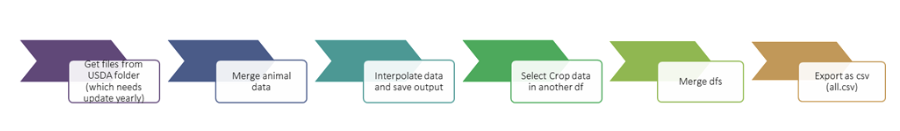

We will interpolate the animal data in order to populate empty years, since we only have data for the Census years and we want data for 1997 till 2019.

After we will prepare the crop data, also dealing with Nan values.

We will join this two data sets.

#### Animal

In [3]:
# path
dir_name = parent_dir + "\\USDA_files\\"

files = os.listdir(dir_name)

# only get ANIMAL counties data
filestoremove = ['cattle_slaughtered_head_state_ifew_ge1997.csv','hogs_slaughtered_head_state_ifew_ge1997.csv', 
                 'poultry_slaughtered_pounds_us_ifew_ge1997.csv', 'corn_grain_yield_buperacre_counties_ifew_ge1997.csv',
                 'corn_grain_area_harvested_acres_counties_ifew_ge1997.csv', 'corn_silage_area_harvested_acres_counties_ifew_ge1997.csv',
                 'corn_area_planted_acres_counties_ifew_ge1997.csv', 'corn_area_planted_acres_counties_ifew_ge1997.csv', 
                 'corn_silage_yield_tonsperacre_counties_ifew_ge1997.csv','soybeans_area_harvested_acres_counties_ifew_ge1997.csv', 
                 'soybeans_area_planted_acres_counties_ifew_ge1997.csv','soybeans_yield_buperacre_counties_ifew_ge1997.csv']

files = [x for x in files if x not in filestoremove]

In [ ]:
# print all columns
#print(list(merged_df.columns))

In [4]:
# create an empty list to store all the dataframes
dfs = []

# loop through each file in the list of files
for file in files:
    f1 = os.path.join(dir_name, file)
    df = pd.read_csv(f1)
    # add a suffix to each column name except for 'year' and 'county_name'
    df.columns = [col + '_' + file.split('_')[0] if col not in ['year', 'county_name'] else col for col in df.columns]
    dfs.append(df)

# merge dataframes on county and year columns
merged_df = pd.merge(dfs[0], dfs[1], on=['county_name', 'year'], how='outer')
for i in range(2, len(dfs)):
    merged_df = pd.merge(merged_df, dfs[i], on=['county_name', 'year'], how='outer')

# Drop unwanted columns
animal_df = merged_df.drop(merged_df[['source_desc_beef', 'sector_desc_beef', 'group_desc_beef', 'commodity_desc_beef',
                            'class_desc_beef', 'prodn_practice_desc_beef', 'util_practice_desc_beef',
                            'statisticcat_desc_beef', 'unit_desc_beef', 'short_desc_beef', 'domain_desc_beef',
                            'domaincat_desc_beef', 'agg_level_desc_beef', 'state_ansi_beef', 'state_fips_code_beef',
                            'state_alpha_beef', 'state_name_beef', 'asd_desc_beef', 'county_ansi_beef',
                            'county_code_beef', 'region_desc_beef', 'zip_5_beef', 'watershed_code_beef',
                            'watershed_desc_beef', 'congr_district_code_beef', 'country_code_beef', 'country_name_beef',
                            'location_desc_beef', 'freq_desc_beef', 'begin_code_beef', 'end_code_beef',
                            'reference_period_desc_beef', 'week_ending_beef', 'load_time_beef',
                            'CV (%)_beef', 'source_desc_hogs', 'sector_desc_hogs', 'group_desc_hogs',
                            'commodity_desc_hogs', 'class_desc_hogs', 'prodn_practice_desc_hogs', 'util_practice_desc_hogs',
                            'statisticcat_desc_hogs', 'unit_desc_hogs', 'short_desc_hogs', 'domain_desc_hogs',
                            'domaincat_desc_hogs', 'agg_level_desc_hogs', 'state_ansi_hogs', 'state_fips_code_hogs',
                            'state_alpha_hogs', 'state_name_hogs', 'asd_code_hogs', 'asd_desc_hogs', 'county_ansi_hogs',
                            'county_code_hogs', 'region_desc_hogs', 'zip_5_hogs', 'watershed_code_hogs',
                            'watershed_desc_hogs', 'congr_district_code_hogs', 'country_code_hogs', 'country_name_hogs',
                            'location_desc_hogs', 'freq_desc_hogs', 'begin_code_hogs', 'end_code_hogs',
                            'reference_period_desc_hogs', 'week_ending_hogs', 'load_time_hogs', 
                            'CV (%)_hogs', 'source_desc_milk', 'sector_desc_milk', 'group_desc_milk',
                            'commodity_desc_milk', 'class_desc_milk', 'prodn_practice_desc_milk', 'util_practice_desc_milk',
                            'statisticcat_desc_milk', 'unit_desc_milk', 'short_desc_milk', 'domain_desc_milk',
                            'domaincat_desc_milk', 'agg_level_desc_milk', 'state_ansi_milk', 'state_fips_code_milk',
                            'state_alpha_milk', 'state_name_milk', 'asd_code_milk', 'asd_desc_milk', 'county_ansi_milk',
                            'county_code_milk', 'region_desc_milk', 'zip_5_milk', 'watershed_code_milk',
                            'watershed_desc_milk', 'congr_district_code_milk', 'country_code_milk', 'country_name_milk',
                            'location_desc_milk', 'freq_desc_milk', 'begin_code_milk', 'end_code_milk',
                            'reference_period_desc_milk', 'week_ending_milk', 'load_time_milk',
                            'CV (%)_milk', 'source_desc_other', 'sector_desc_other', 'group_desc_other',
                            'commodity_desc_other', 'class_desc_other', 'prodn_practice_desc_other',
                            'util_practice_desc_other', 'statisticcat_desc_other', 'unit_desc_other', 'short_desc_other',
                            'domain_desc_other', 'domaincat_desc_other', 'agg_level_desc_other', 'state_ansi_other',
                            'state_fips_code_other', 'state_alpha_other', 'state_name_other', 'asd_code_other',
                            'asd_desc_other', 'county_ansi_other', 'county_code_other', 'region_desc_other', 'zip_5_other',
                            'watershed_code_other', 'watershed_desc_other', 'congr_district_code_other',
                            'country_code_other', 'country_name_other', 'location_desc_other', 'freq_desc_other',
                            'begin_code_other', 'end_code_other', 'reference_period_desc_other', 'week_ending_other',
                            'load_time_other', 'CV (%)_other']], axis = 1)

# Rename colums
animal_df = animal_df.rename(columns={
    'county_name': 'County Name',
    'asd_code_beef': 'Ag District',
    'Value_beef': 'Beef Cattle',
    'Value_hogs': 'Hogs',
    'Value_milk': 'Milk Cattle',
    'Value_other': 'Other Cattle'})

(D) = "Suppressed to avoid disclosing data for individual operations." This means that the data has been intentionally withheld to protect the privacy of individual farmers or operations.

It is generally not recommended to include suppressed data in the analysis as it can introduce bias and affect the accuracy of the model.

One approach to dealing with suppressed data in linear regression is to remove them from the dataset. This can be done using the Pandas drop() method or by selecting only the rows with non-suppressed data using boolean indexing.

Another approach is to impute missing values in the dataset. However, imputation of suppressed data is not recommended as it can introduce biases in the data and affect the accuracy of the model.

Therefore, it is recommended to remove the rows with suppressed data from the dataset before conducting linear regression.

In order to validate the interpolation, we use yearly data for Iowa and compared it with the sum of our results.

In [5]:
animal_df = animal_df.replace(',', '', regex=True)
animal_df = animal_df.replace(' (D)', float('nan')).astype({'Beef Cattle': 'float'})
animal_df = animal_df.replace(' (D)', float('nan')).astype({'Hogs': 'float'})
animal_df = animal_df.replace(' (D)', float('nan')).astype({'Milk Cattle': 'float'})
animal_df = animal_df.replace(' (D)', float('nan')).astype({'Other Cattle': 'float'})

In [6]:
#Function for animal population
def IFEWs_animal(animal_df, int_kind):
    # Create dataframe to be populated
    # Generate missing years
    years_to_pop = np.arange(1997, 2020, 1)

    county_names = animal_df['County Name'].unique()
    dataframes = []

    # for each population
    pop_names = ['Beef Cattle','Hogs', 'Milk Cattle', 'Other Cattle']

    # Loop through county names and populate data
    for county_name in county_names:
        data = pd.DataFrame(columns=['Year','County', 'Beef Cattle', 'Hogs', "Milk Cattle","Other Cattle"])

        # For each population
        for name in pop_names:
            k = pop_names.copy()
            k.remove(name)

            df_current = animal_df[animal_df['County Name'] == county_name].drop(k, axis=1)

            # Ignore NaN values for years populated
            df_current = df_current.dropna()

            # Get known data
            # Get years
            years = df_current['year'].unique()
            years = years.tolist()
            # Get population
            population = df_current[name]
            population = population.tolist()

            # Create interpolation function
            if len(years) == 2:
                # For 2 available years, use average for missing years
                predicted_population = np.full((23,), np.mean(population))
                # Update available years with known data
                mask = np.isin(years_to_pop, years)
                predicted_population[mask] = population

            elif len(years) == 1:
                # For 1 available year, use constant value for all missing years
                predicted_population = np.full((23,), population[0])

            elif len(years) == 0:
                # For 0 available year, use 0 value for all missing years
                predicted_population = np.full((23,), 0)

            else:
                # For more than 2 available years, use interpolation
                #validate kind with Iowa total comparison
                f = interp1d(years, population, kind=int_kind, fill_value='extrapolate')
                predicted_population = f(years_to_pop)
                # Prevent negative values
                predicted_population[predicted_population < 0] = 0

            # Populate dataframe
            # Output data
            data['Year'] = years_to_pop
            data[name] = predicted_population
            data['County'] = [county_name]*23

        # Append current county data to the list of dataframes
        dataframes.append(data)
        # Concatenate all dataframes to create the final dataframe
        final = pd.concat(dataframes, ignore_index=True) 
        
    # Verify that all original values are in place.    
    # loop over rows in animal_df and update final_df as needed
    for index, row in animal_df.iterrows():
        county = row['County Name']
        year = row['year']
        for variable in pop_names:
            value = row[variable]
            if not np.isnan(value):
                final_index = (final['Year'] == year) & (final['County'] == county)
                final_value = final.loc[final_index, variable].values[0]
                if final_value != value:
                    final.loc[final_index, variable] = value
    return final

In [7]:
# create dictionary to store df_merged for each kind
merged_dict = {}

# run for all kinds and choose best one 
kinds = ["linear", "nearest", "nearest-up", "zero", "slinear", "quadratic", "previous", "next"]

for kind in kinds:
    #print(kind)
    final = IFEWs_animal(animal_df=animal_df, int_kind = kind)
    # Dataset for validation
    f_valid = os.path.join(parent_dir, "Iowa_AnimalProdction.csv")
    df_valid = pd.read_csv(f_valid)

    # Validation
    # Calculate sum (Iowa total) for each year based on dataframe final above
    df_IFEWs = final.drop(['County'], axis=1)
    df_IFEWs = df_IFEWs.groupby('Year').sum()
    # years 1997-2000 can be dropped since there is no data for validation
    df_IFEWs = df_IFEWs.drop(df_IFEWs.index[[0,1,2,3]])
    df_IFEWs = df_IFEWs.reset_index()

    # Compare data
    # merge dataframes on Year column
    df_merged = pd.merge(df_valid, df_IFEWs, on='Year', suffixes=('_valid', '_IFEWs'))
    # calculate error for each animal variable and year
    for animal in ['Milk Cattle', 'Beef Cattle', 'Other Cattle', 'Hogs']:
        valid_col = f"{animal}_valid"
        ifews_col = f"{animal}_IFEWs"
        error_col = f"{animal}_error"
        df_merged[error_col] = (df_merged[valid_col] - df_merged[ifews_col]).abs()

    # store df_merged for this kind in the dictionary
    merged_dict[kind] = df_merged

# find the kind with the smallest errors
min_error = float('inf')
best_kind = ""
for kind, merged_df in merged_dict.items():
    # calculate total error for each kind
    total_error = merged_df.filter(regex='_error$').sum().sum()
    if total_error < min_error:
        min_error = total_error
        best_kind = kind

# output the kind with the smallest errors
best_kind

'quadratic'

Now we can save the final animal data in animal

In [8]:
animal = IFEWs_animal(animal_df=animal_df, int_kind = best_kind)

In [9]:
# Set the seed for reproducibility
random_seed = 123

# Get a list of all unique counties in the animal dataframe
counties = animal['County'].unique()

# Randomly select 10 counties from the list
random_counties = pd.Series(counties).sample(n=10, random_state=random_seed)

# Create a new dataframe containing only the rows with the selected counties
subset_animal = animal[animal['County'].isin(random_counties)]

# Keep all columns in the subset dataframe
subset_animal = subset_animal.loc[:, :]



fig = px.line(subset_animal, x="Year", y="Other Cattle", color="County", line_group="County")
fig.show()

In [10]:
# Compare with old 
# Get a list of all unique counties in the animal dataframe
counties = animal['County'].unique()

# Randomly select 10 counties from the list
random_counties = pd.Series(counties).sample(n=10, random_state=random_seed)

# Create a new dataframe containing only the rows with the selected counties
subset_animal_old = animal_df[animal_df['County Name'].isin(random_counties)]

# Keep all columns in the subset dataframe
subset_animal_old = subset_animal_old.loc[:, :]



fig = px.line(subset_animal_old, x="year", y="Other Cattle", color="County Name", line_group="County Name")
fig.show()

#### Crop

Get data

In [11]:
files = os.listdir(dir_name)

# only get counties and crop data
filestoremove = ['cattle_slaughtered_head_state_ifew_ge1997.csv','hogs_slaughtered_head_state_ifew_ge1997.csv', 
                 'poultry_slaughtered_pounds_us_ifew_ge1997.csv', 'beef_cows_head_inventory_counties_ifew_ge1997.csv', 
                 'hogs_head_inventory_counties_ifew_ge1997.csv', 'milk_cows_head_inventory_counties_ifew_ge1997.csv', 
                 'other_cattle_head_inventory_counties_ifew_ge1997.csv', 
                 'corn_silage_area_harvested_acres_counties_ifew_ge1997.csv','corn_silage_yield_tonsperacre_counties_ifew_ge1997.csv',]

files = [x for x in files if x not in filestoremove]

# create an empty list to hold dataframes
dfs = []

# loop through each file in the list of files
for file in files:
    f1 = os.path.join(dir_name, file)
    df = pd.read_csv(f1)
    # add a suffix to each column name except for 'year' and 'county_name'
    suffix = '_' + file.split('_')[0] + '_' + file.split('_')[1] + '_' + file.split('_')[2] + file.split('_')[3] # get the first three letters after the third underscore in the file name
    df.columns = [col + '_' + suffix if col not in ['year', 'county_name'] else col for col in df.columns]
    dfs.append(df)

# merge the dataframes using 'county_name' and 'year' as keys
df_merged = pd.merge(dfs[0], dfs[1], on=['county_name', 'year'], how='left')
for i in range(2, len(dfs)):
    df_merged = pd.merge(df_merged, dfs[i], on=['county_name', 'year'], how='left')
    
    
# Clean unwanted columns
wanted = ['county_name', "year", "Value__corn_area_plantedacres", "Value__corn_grain_areaharvested", 
          "Value__corn_grain_yieldbuperacre", "Value__soybeans_area_harvestedacres","Value__soybeans_area_plantedacres",
          "Value__soybeans_yield_buperacrecounties"]

# drop unwanted columns
df_crops = df_merged.drop(df_merged[[item for item in (df_merged.columns).tolist() if item not in wanted]], axis=1)

df_crops.rename(columns = {'county_name': "County", "year": "Year", "Value__corn_area_plantedacres": 'CAP',
                 "Value__corn_grain_areaharvested":"CGH", "Value__corn_grain_yieldbuperacre": "CGY",
                 "Value__soybeans_area_harvestedacres":"SH", "Value__soybeans_area_plantedacres":"SAP",
                 "Value__soybeans_yield_buperacrecounties": "SY"}, inplace = True)

**Understand the column names and units**

1. CAP = Corn Area Planted (acres)

2. CGH= Corn Grain Area Harvested (acres)

3. CGY = Corn Grain Yield (bu/ac)

4. SAP = Soybeans planted (acres)

5. SH = Soybeans Area Harvested (acres)

6. SY = Soybeans Yield (bu/ac)

**Deal with Nan values**

In [12]:
col = ['CAP', 'CGH', 'CGY', 'SH', 'SAP', 'SY']
# group by year and county and fill missing values with the minimum value in each group
for column in col:
    df_crops[column] = df_crops.groupby(['Year', 'County'])[column].fillna(method='ffill').fillna(method='bfill')
    
    
df_crops = df_crops.replace(',', '', regex=True)
    
# Change data type
df_crops[['CAP', 'CGH', 'CGY', 'SH', 'SAP', 'SY']] = df_crops[['CAP', 'CGH', 'CGY', 'SH', 'SAP', 'SY']].apply(pd.to_numeric)

In [13]:
#drop any rows that have 7 in the rebounds column
df_crops = df_crops[df_crops.Year != 2022]
df_crops = df_crops[df_crops.Year != 2021]
df_crops = df_crops[df_crops.Year != 2020]

No data for crops in Taylor in 2015.

In [14]:
# Define a function to interpolate missing years for a specific county
def interpolate_missing_year(df, county, year):
    # Get the mean values of the previous and next years for the given county
    prev_year = year - 1
    next_year = year + 1
    prev_year_data = df[(df['County'] == county) & (df['Year'] == prev_year)]
    next_year_data = df[(df['County'] == county) & (df['Year'] == next_year)]
    if len(prev_year_data) == 0 or len(next_year_data) == 0:
        return None
    mean_values = {}
    for column in df.columns:
        if column not in ['Year', 'County'] and column in prev_year_data.columns and column in next_year_data.columns:
            prev_value = prev_year_data[column].iloc[0]
            next_value = next_year_data[column].iloc[0]
            mean_values[column] = (prev_value + next_value) / 2
        elif column not in ['Year', 'County']:
            values = []
            if len(prev_year_data) > 0:
                values.append(prev_year_data[column].iloc[0])
            if len(next_year_data) > 0:
                values.append(next_year_data[column].iloc[0])
            if len(values) > 0:
                mean_values[column] = sum(values) / len(values)
    # Create a new row in the data frame for the missing year and populate it with the mean values
    new_row = {'Year': year, 'County': county}
    new_row.update(mean_values)
    return new_row


# Loop over all counties and years to interpolate missing data
for county in df_crops['County'].unique():
    for year in df_crops['Year'].unique():
        # Check if the county and year combination is missing from the data frame
        if len(df_crops[(df_crops['County'] == county) & (df_crops['Year'] == year)]) == 0:
            # Interpolate the missing year for the specific county
            new_row = interpolate_missing_year(df_crops, county, year)
            # If a new row was created, append it to the data frame
            if new_row is not None:
                df_crops = df_crops.append(new_row, ignore_index=True)

C:\Users\julia\AppData\Local\Temp\ipykernel_23360\575089305.py:39: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

C:\Users\julia\AppData\Local\Temp\ipykernel_23360\575089305.py:39: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

C:\Users\julia\AppData\Local\Temp\ipykernel_23360\575089305.py:39: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

C:\Users\julia\AppData\Local\Temp\ipykernel_23360\575089305.py:39: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

C:\Users\julia\AppData\Local\Temp\ipykernel_23360\575089305.py:39: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat 

#### Merge Crop and Animal 

In [15]:
# animal must be first because has longer dataframe
df_USDA = pd.merge(animal, df_crops, on=['County', 'Year'], how='left')

# Prepare County Names column
df_USDA['County'] = df_USDA['County'].apply(lambda x: x.title())

## N fertilizer from Raster to Counties/AgDistricts feature class
All the data comes from Agricultural nitrogen fertilizer uses in the continental U.S. during 1850-2015: a set of gridded time-series data. PANGAEA and the added rates given by Peiyu Cao (Iowa State) (ALL DATA FROM FOLDER IN LB N/Acre) in the format of 4km grids with rates in lb/acre, from 1850 to 2019 (we are interested only in 1997 to present). They are working on updating the data till present time. So more data can be added using the following script.

The workflow of the processes covered here is illustraded below.

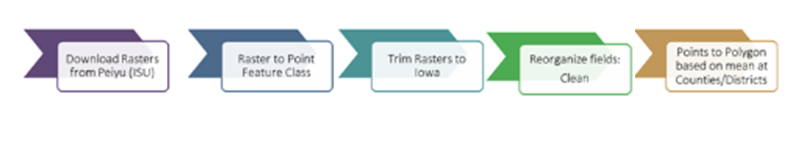

### Rasters to Feature Class
First, we clip the Nrate files for Iowa boundaries.
#### Clip Iowa

In [16]:
# path
dir_name1 = parent_dir + "\\N fertilizer maps US from 2022\\"

files = os.listdir(dir_name1)

# select only files containing years of interest. And as .tif
# remove folder N fertilizer data
files = [x for x in files if "N fertilizer data" not in x]

# remove unwanted years
y = [i for i in range(1900,1997,1)]
y = [str(x) for x in y]
for i in range(len(y)):
    files = [x for x in files if y[i] not in x]

In [17]:
for file in files:
    f = os.path.join(dir_name1, file)

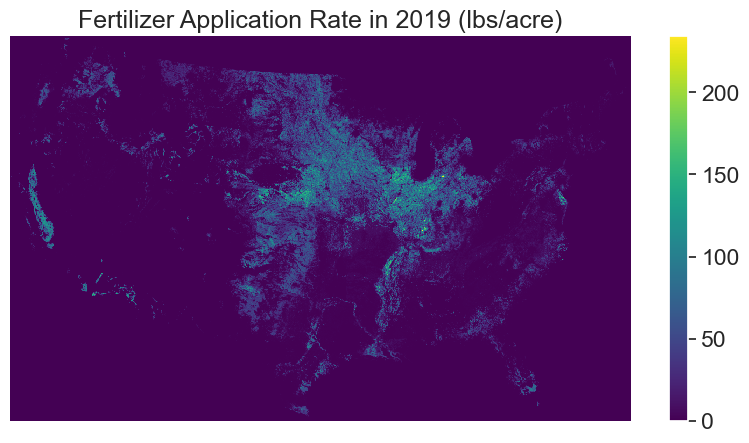

In [18]:
# Plot one of tif files
fertilizer_im = rxr.open_rasterio(f, masked=True).squeeze()

f, ax = plt.subplots(figsize=(10, 5))
fertilizer_im.plot.imshow()
ax.set(title="Fertilizer Application Rate in 2019 (lbs/acre)")

ax.set_axis_off()
plt.show()

In [19]:
# Get boundary data
file_boundary = os.path.join(parent_dir, "Iowa Counties", 'IowaCounties.shp')

# Open crop extent (your study area extent boundary)
iowa = gpd.read_file(file_boundary)

In [20]:
print('crop extent crs: ', iowa.crs)
print('lidar crs: ', fertilizer_im.rio.crs)

crop extent crs:  PROJCS["WGS_1984_Web_Mercator_Auxiliary_Sphere",GEOGCS["WGS 84",DATUM["WGS_1984",SPHEROID["WGS 84",6378137,298.257223563,AUTHORITY["EPSG","7030"]],AUTHORITY["EPSG","6326"]],PRIMEM["Greenwich",0],UNIT["Degree",0.0174532925199433]],PROJECTION["Mercator_1SP"],PARAMETER["central_meridian",0],PARAMETER["scale_factor",1],PARAMETER["false_easting",0],PARAMETER["false_northing",0],UNIT["Meter",1],AXIS["Easting",EAST],AXIS["Northing",NORTH],EXTENSION["PROJ4","+proj=merc +a=6378137 +b=6378137 +lat_ts=0 +lon_0=0 +x_0=0 +y_0=0 +k=1 +units=m +nadgrids=@null +wktext +no_defs"]]
lidar crs:  PROJCS["Albers_Conical_Equal_Area",GEOGCS["NAD83",DATUM["North American Datum 1983",SPHEROID["GRS 1980",6378137,298.257222101004]],PRIMEM["Greenwich",0],UNIT["degree",0.0174532925199433,AUTHORITY["EPSG","9122"]]],PROJECTION["Albers_Conic_Equal_Area"],PARAMETER["latitude_of_center",23],PARAMETER["longitude_of_center",-96],PARAMETER["standard_parallel_1",29.5],PARAMETER["standard_parallel_2",45.5],

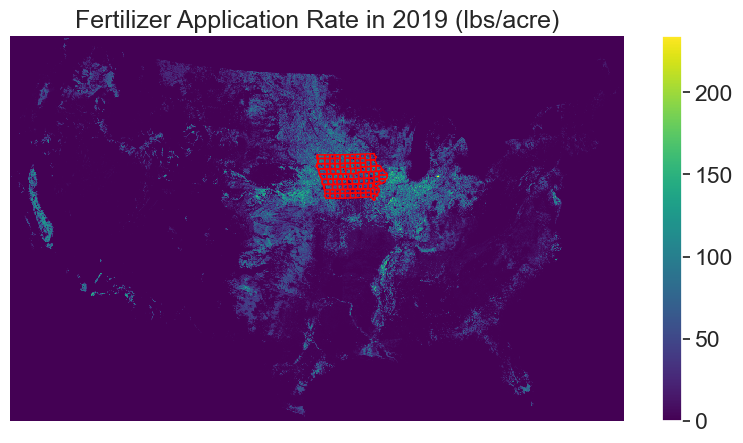

In [21]:
# Change CRS of crop extent to match the raster image
iowa1 = iowa.to_crs(fertilizer_im.rio.crs)

# Plot the crop extent over the raster image
f, ax = plt.subplots(figsize=(10, 5))
fertilizer_im.plot.imshow()
iowa1.plot(ax=ax, facecolor="none", edgecolor="red")
ax.set(title="Fertilizer Application Rate in 2019 (lbs/acre)")

ax.set_axis_off()
plt.show()

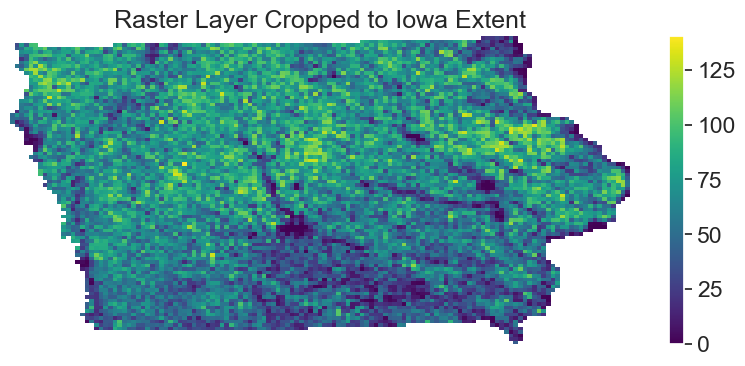

In [22]:
nrate_clipped = fertilizer_im.rio.clip(iowa.geometry.apply(mapping),
                                      # This is needed if your GDF is in a diff CRS than the raster data
                                      iowa.crs)

f, ax = plt.subplots(figsize=(10, 4))
nrate_clipped.plot(ax=ax)
ax.set(title="Raster Layer Cropped to Iowa Extent")
ax.set_axis_off()
plt.show()

In [23]:
# export new data
path_to_tif_file = os.path.join(parent_dir,
                                "N fertilizer maps US from 2022",'N fertilizer data_Iowa', 
                                "nrate_clipped.tif")

# Write the data to a new geotiff file
nrate_clipped.rio.to_raster(path_to_tif_file)

#### Interpolate area
This section will transform data from raster to points so we can interpolate the data and generate data for each county
This will be done here for year 2019. A for loop will make this for all necessary years (1997 to 2021)

In [24]:
# Convert the raster dataset to a point shapefile using rasterio
with rasterio.open(path_to_tif_file) as src:
    data = src.read(1, masked=True)
    if not data.mask.all():
        meta = src.meta
        points = np.where(data.mask == False)
        if len(points) == 1:
            lon, lat = src.xy(points[0], np.zeros_like(points[0]))
        else:
            lon, lat = src.xy(points[0], points[1])
        df = pd.DataFrame({'Longitude': lon, 'Latitude': lat})
        geometry = gpd.points_from_xy(df.Longitude, df.Latitude)
        crs = src.crs
        point_gdf = gpd.GeoDataFrame(df, crs=crs, geometry=geometry)

In [25]:
# Compute mean values of raster dataset in polygons of Iowa shapefile - shoud output 99 values (one for each county)
stats = zonal_stats(iowa1, path_to_tif_file, stats='mean', nodata=-999)
mean_vals = [feature['mean'] for feature in stats]
iowa['CN_lb/acres'] = mean_vals

In [26]:
# Change CRS to UTM zone 15N
iowa_utm = iowa.to_crs(epsg=26915)

Text(0.5, 1.0, 'Nitrogen Application Rates (pounds/acre) in Iowa from Peiyu')

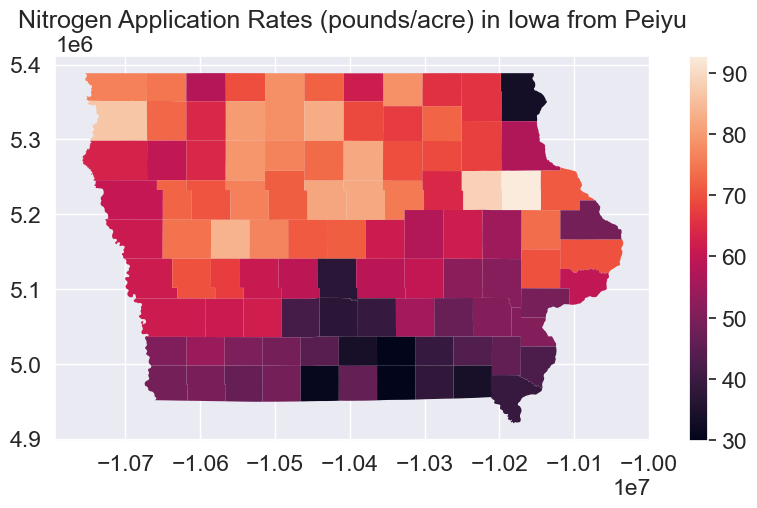

In [27]:
#iowa.crs
figsize = (10, 5)

iowa.plot('CN_lb/acres', legend=True, figsize=figsize, edgecolor='none');

plt.title('Nitrogen Application Rates (pounds/acre) in Iowa from Peiyu')

#### Clean shapefile

In [28]:
iowa = iowa.drop(['FID', 'PERIMETER', 'DOMCountyI',  'FIPS', 'FIPS_INT', 'SHAPE_Leng', 'SHAPE_Area'], axis=1)

In [29]:
iowa.rename(columns={'CountyName': 'County'}, inplace = True)
iowa['County'] = iowa['County'].replace('Obrien', "O Brien")
iowa

,County,StateAbbr,geometry,CN_lb/acres
0,Lyon,IA,"POLYGON ((-10753368.681 5388440.461, -10751956...",76.203866
1,Osceola,IA,"POLYGON ((-10671185.490 5388386.000, -10668976...",74.661412
2,Dickinson,IA,"POLYGON ((-10618522.148 5388426.616, -10617142...",57.887037
3,Emmet,IA,"POLYGON ((-10565862.525 5388522.266, -10563991...",69.499925
4,Allamakee,IA,"POLYGON ((-10198062.048 5388480.894, -10198046...",33.310334
...,...,...,...,...
94,Davis,IA,"POLYGON ((-10312555.102 4997449.487, -10310440...",38.070688
95,Decatur,IA,"POLYGON ((-10465679.486 4997168.288, -10463496...",30.980637
96,Wayne,IA,"POLYGON ((-10414659.176 4997363.711, -10412607...",46.191698
97,Appanoose,IA,"POLYGON ((-10363575.806 4997342.182, -10361503...",29.932497


#### Loop for all files of Nrate

In [30]:
for idx, file in enumerate(files):
    # Open crop extent (your study area extent boundary)
    iowa = gpd.read_file(file_boundary)
    
    year = 1997 + idx
    f = os.path.join(dir_name1, file)
    # Open rasters
    fertilizer_im = rxr.open_rasterio(f, masked=True).squeeze()
    # Clip data
    nrate_clipped = fertilizer_im.rio.clip(iowa.geometry.apply(mapping),
                                      # This is needed if your GDF is in a diff CRS than the raster data
                                      iowa.crs)
    # export new data
    path_to_tif_file = os.path.join(parent_dir,
                                    "N fertilizer maps US from 2022",'N fertilizer data_Iowa', 
                                    file)

    # Write the data to a new geotiff file
    nrate_clipped.rio.to_raster(path_to_tif_file)
    
    # Convert the raster dataset to a point shapefile using rasterio
    with rasterio.open(path_to_tif_file) as src:
        data = src.read(1, masked=True)
        if not data.mask.all():
            meta = src.meta
            points = np.where(data.mask == False)
            if len(points) == 1:
                lon, lat = src.xy(points[0], np.zeros_like(points[0]))
            else:
                lon, lat = src.xy(points[0], points[1])
            df = pd.DataFrame({'Longitude': lon, 'Latitude': lat})
            geometry = gpd.points_from_xy(df.Longitude, df.Latitude)
            crs = src.crs
            point_gdf = gpd.GeoDataFrame(df, crs=crs, geometry=geometry)

    # Compute mean values of raster dataset in polygons of Iowa shapefile - shoud output 99 values (one for each county)
    stats = zonal_stats(iowa1, path_to_tif_file, stats='mean', nodata=-999)
    mean_vals = [feature['mean'] for feature in stats]
    iowa['CN_lb/ac'] = mean_vals
    
    # Add year column
    iowa['date'] = year

    # Change CRS to UTM zone 15N
    iowa_utm = iowa.to_crs(epsg=26915)

    #clean shapefiles
    iowa = iowa.drop(['FID', 'PERIMETER', 'DOMCountyI',  'FIPS', 'FIPS_INT', 'SHAPE_Leng', 'SHAPE_Area'], axis=1)

    # Save the shapefile
    path_to_shp_file = os.path.join(parent_dir,
                                    "N fertilizer maps US from 2022",'N fertilizer data_Iowa', 
                                    f"Nrate_{year}.shp")
    iowa_utm.to_file(path_to_shp_file)
    

#### Aggregate Shapefiles in One shapefile (temporal series)
Read in each shapefile as a separate GeoDataFrame and store them in a list:

In [31]:
# path
dir_name2 = parent_dir + "\\N fertilizer maps US from 2022\\N fertilizer data_Iowa"

files = os.listdir(dir_name2)

# select only shapefiles

# remove files that are not shp
files = [x for x in files if ".shp" in x]

filepaths = []
for file in files:
    f = os.path.join(dir_name2, file)
    filepaths.append(f)
    
gdfs = []
for filepath in filepaths:
    gdf = gpd.read_file(filepath)
    gdfs.append(gdf)    

In [32]:
# Concatenate the list of geodata into a single one
merged_gdf = pd.concat(gdfs, ignore_index=True)

# Extract the year from a column in the GeoDataFrame, and create a new column for the year
merged_gdf['date'] = pd.to_datetime(merged_gdf['date'], format='%Y')
merged_gdf['Year'] = merged_gdf['date'].dt.year

# Drop date column and all unsuaful columns
merged_gdf = merged_gdf.drop(['FID', 'PERIMETER', 'DOMCountyI',  'FIPS', 'FIPS_INT', 'SHAPE_Leng', 'SHAPE_Area', 'date'], axis=1)

# Makes column names compatible with USDA data
merged_gdf.rename(columns={"CountyName":"County", "StateAbbr":"State"}, inplace = True)

## Merge USDA and Nrate

In [33]:
IFEWs = pd.merge(df_USDA, merged_gdf, on=['County', 'Year'], how='left')

## Calculate Nsurplus variables (and others)
The script below will use Vishal's Nitrogen Surplus model according to the workflow in the figure below:
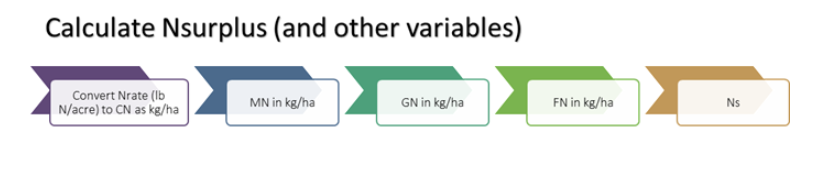
In Vishal's study "the MDAO approach is applied to the IFEW system to model the synergies of the inherently coupled food, water, and energy disciplines with the goal of meeting Iowa’s agricultural demands. The purpose of the model is to provide critical information regarding the complex interdependencies to enable efficient policy and decision making in Iowa with respect to the environmental impact of the nitrogen export."

In particular, the IFEWs model involves five individual systems representing weather, water, agriculture, animal agriculture,and energy. The below modeling addresses the agricutlure and water (nitrogen surplus as a water quality indicador) of the IFEWs. 

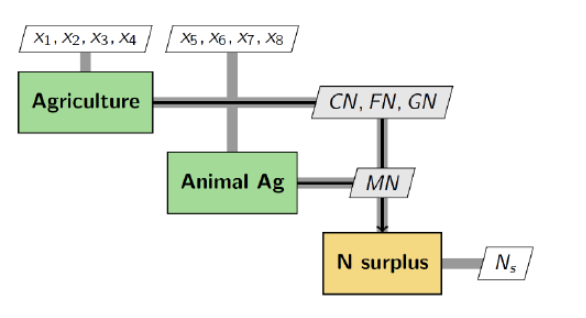

"The calculation of nitrogen surplus (Ns) is based on the construction of a rough agronomic annual nitrogen budget (Blesh and Drinkwater, 2013; Jones et al., 2019a) given as:
$$ Ns = CN + MN + FN - GN $$

where CN is the input from the application of commercial nitrogen, MN is the nitrogen generated from manure, FN is the nitrogen fixed by soybean crop, and GN is the nitrogen present in harvested grain."

"The agriculture system receives four input parameters: the corn yield ($x_1$), soybean yield ($x_2$), rate of commercial, nitrogen for corn ($x_3$), and the rate of commercial nitrogen, for soybean ($x_4$). The output parameters of the agriculture, system are CN, FN, and GN." In this current document, we make no distinction between rates of commercial nitrogen ($x_3$, $x_4$). The commercial nitrogen (CN) is defined as equal to the average of the spatially explicit time-series data set of nitrogen (N) fertilizer use in agricultural land of the continental U.S provided by Peiyu Cao in kg/ha.

$$ CN = N_{rate} kg/ha $$ 

"The biological nitrogen fixation from the soybean crop is estimated based on relationship provided by Barry et al. (1993) and is given by:"
$$ FN = (81.1x_2-98.5)A_{soy}/A $$

where $A_{soy}$ represents Iowa soybean acreage while the $A$ represents the total area under corn and soybean crop (**planted area**), and $x_2$ in this case is the soybean yield in *tons per hectare.

"Lastly, nitrogen exported in the harvested corn and soybean grain is computed to be 6.4% nitrogen in the soybean seed and 1.18% nitrogen in the corn seed (Blesh and Drinkwater, 2013) and is defined as:"

$$ GN = \left(x_1\left(\frac{1.18}{100}\right)A_{corn} + x_2\left(\frac{6.4}{100}\right)A_{soy}\right)/A $$

Where the areas refer to **harvested areas**.

For this work, the yields comes from yearly USDA reports.

"The animal agriculture system receives four input parameters, namely, the total hog/pig population ($x_5$), number of beef cows ($x_6$), number of milk cows ($x_7$), and the number of other cattle ($x_8$) which includes the population steers, heifers, and slaughter cattle. According to USDA (2020), Iowa holds first rank in red meat, pork, and egg production, however, the amount of nitrogen in poultry is much less than hogs and cattle. Thus, to keep the minimum number of parameters in our system model, only hog/pig and cattle populations are used for the MN calculation.The annual manure nitrogen contribution of each animal type is given by (Gronberg and Arnold, 2017):

$$ MN_{animal} = PA_{MN}LF $$

where P, AMN and LF are livestock group population, nitrogen in animal manure and life cycle of animal. Table 1 provides the numerical values of the parameters used for calculation of MN for each livestock group. The total MN contribution is then normalized using area $A$ (**crops planted area**) is given as:

 $$ MN = (MN_{Hogs} + MN_{BeefCattle} + MN_{MilkCow} + MN_{OtherCattle})/A $$
 
 In the same way, the animal population uses USDA as the source, but because of the lack of yearly data (only Census years are available) we interpolated the USDA data extending our data availability.
 
 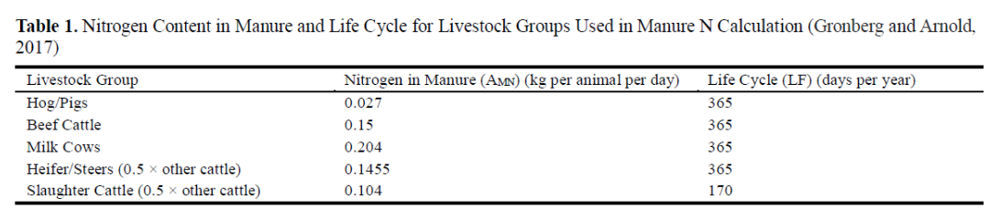
 
 More information can be found here <a href="http://www.jeiletters.org/index.php?journal=mys&page=article&op=view&path%5B%5D=202000044&path%5B%5D=pdf_202000044">System Modeling and Sensitivity Analysis of the Iowa Food-Water-Energy Nexus</a>
 
 **Understand the column names and units**

1. CN = Commercial Nitrogen in kg/ha

2. MN = Manure Nitrogen in kg/ha

3. GN = Grain Nitrogen in kg/ha

4. FN = Fixation Nitrogen in kg/ha

#### Commercial Nitrogen in kg/ha

In [34]:
IFEWs['CN'] = round(IFEWs["CN_lb/ac"]*1.121, 1)

#### Manure Nitrogen in kg/ha
Total Crop area planted - Apply manure nitrogen to planted areas.

In [35]:
# Define the function to calculate ManureN_kg_ha for each row
def calculate_manure_n(row):
    hogs = row['Hogs']
    milk_cows = row['Milk Cattle']
    beef_cows = row['Beef Cattle']
    other_cattle = row['Other Cattle']
    soybeans_acres = row['SAP']
    corn_acres = row['CAP']
    
    manure_n = (hogs * 0.027 * 365 + milk_cows * 0.204 * 365 + beef_cows * 0.15 * 365 + other_cattle * 0.5 * 0.1455 * 365 + other_cattle * 0.5 * 0.104 * 170) / (0.404686 * (soybeans_acres + corn_acres))
    
    return round(manure_n, 1)

# Apply the function to create the ManureN_kg_ha field
IFEWs['MN'] = IFEWs.apply(calculate_manure_n, axis=1)

#### Grain Nitrogen in kg/ha

In [36]:
def calculate_grain_n(row):
    soybeans_yield = row['SY']
    corn_yield = row['CGY']
    soybeans_acres_h = row['SH']
    corn_acres_h = row['CGH']
    
    grain_n = ((soybeans_yield*67.25)*(6.4/100)*(soybeans_acres_h*0.404686)+(corn_yield*62.77)*(1.18/100)*corn_acres_h*0.404686)/(0.404686*(soybeans_acres_h+corn_acres_h))
    
    return round(grain_n, 1)

# Apply the function to create the ManureN_kg_ha field
IFEWs['GN'] = IFEWs.apply(calculate_grain_n, axis=1)

#### Fixation Nitrogen in kg/ha
Planted Area Crops

For soybeans bushels consider 1 metric ton/hectare = 14.87 (15) bushels/acre from https://www.extension.iastate.edu/agdm/wholefarm/pdf/c6-80.pdf

In [37]:
def calculate_fix_n(row):
    soybeans_yield = row['SY']
    soybeans_acres = row['SAP']
    corn_acres = row['CAP']
    
    fix_n = ((soybeans_yield/15)*81.1-98.5)*(soybeans_acres/(soybeans_acres+corn_acres))
    
    return round(fix_n, 1)

# Apply the function to create the ManureN_kg_ha field
IFEWs['FN'] = IFEWs.apply(calculate_fix_n, axis=1)

### Nitrogen Surplus
In kg/ha

In [38]:
def calculate_ns(row):
    commercial = row['CN']
    manure = row['MN']
    grain = row['GN']
    fix = row['FN']
    
    ns = commercial + manure + fix - grain
    
    return round(ns, 1)

# Apply the function to create the ManureN_kg_ha field
IFEWs['NS'] = IFEWs.apply(calculate_ns, axis=1)

In [39]:
IFEWs.head(5)

,Year,County,Beef Cattle,Hogs,Milk Cattle,Other Cattle,CAP,CGH,CGY,SH,SAP,SY,State,CN_lb/ac,geometry,CN,MN,GN,FN,NS
0,1997,Buena Vista,4472.0,296162.000,321.0,0.000000,166100.0,162500.0,146.4,154700.0,155900.0,48.4,IA,65.833687,"POLYGON ((305052.986 4753573.985, 306708.092 4...",73.8,24.5,157.1,79.0,20.2
1,1998,Buena Vista,4438.5,287105.128,257.5,2743.560000,168300.0,166000.0,154.6,150100.0,150600.0,48.8,IA,65.877839,"POLYGON ((305052.986 4753573.985, 306708.092 4...",73.8,24.7,159.9,78.1,16.7
2,1999,Buena Vista,4438.5,284370.192,257.5,6864.640000,160000.0,157500.0,165.1,156800.0,157000.0,46.0,IA,63.566293,"POLYGON ((305052.986 4753573.985, 306708.092 4...",71.3,25.8,160.1,74.4,11.4
3,2000,Buena Vista,4438.5,287957.192,257.5,10593.073333,164000.0,160400.0,135.7,152700.0,153000.0,38.4,IA,68.266223,"POLYGON ((305052.986 4753573.985, 306708.092 4...",76.5,27.1,132.1,52.7,24.2
4,2001,Buena Vista,4438.5,297866.128,257.5,13928.860000,159000.0,155800.0,144.4,157200.0,158000.0,46.5,IA,58.251779,"POLYGON ((305052.986 4753573.985, 306708.092 4...",65.3,28.8,153.8,76.2,16.5


## Export data

In [73]:
path = os.path.join(parent_dir, 'IFEWs_1997to2019.csv')
IFEWs.to_csv(path, index=False)

## Interactive Plot

In [66]:
path = os.path.join(parent_dir, 'Iowa_County_Boundaries.geojson')
with open(path) as f:
    counties = geojson.load(f)

counties = gpd.read_file(path)
counties = counties.set_geometry('geometry')    

In [42]:
IFEWs.rename(columns={'County': "CountyName"}, inplace = True)
IFEWs = IFEWs.drop(['geometry'], axis = 1)

In [80]:
# Merge the county names from the counties GeoJSON file into the IFEWs GeoDataFrame
data = counties.merge(IFEWs, on='CountyName')

# Define a function to create the interactive map
def create_map(var):
    fig = px.choropleth_mapbox(
        data_frame=data,
        geojson=counties.geometry,
        locations=data.index,
        color=var,
        color_continuous_scale='Viridis',
        range_color=(-10, data[var].max()),
        mapbox_style='carto-positron',
        zoom=6,
        center={'lat': 41.878, 'lon': -93.097},
        opacity=0.8,
        labels={var: var, 'CountyName': 'County', 'Year': 'Year'},
        hover_data=['CountyName', 'Year', var],
    )
    fig.update_layout(margin={'r':0,'t':0,'l':0,'b':0}, height = 500)
    fig.show()
    
    
# Dropdown Widget    
# create dropdown widget
dropdown = widgets.Dropdown(
    description='Variable:',
    options=('Beef Cattle', 'Hogs', 'Milk Cattle', 'Other Cattle', 'CAP', 'CGH', 'CGY', 'SH', 'SAP', 'SY', 'CN', 'MN', 'GN', 'FN', 'NS')
)

# create function to update map on widget change
def on_change(change):
    if change['type'] == 'change' and change['name'] == 'value':
        create_map(change['new'])

# display widget and initial map
display(dropdown)
# observe widget changes
dropdown.observe(on_change)

# Display
create_map('NS')

Dropdown(description='Variable:', options=('Beef Cattle', 'Hogs', 'Milk Cattle', 'Other Cattle', 'CAP', 'CGH',…

In [ ]:
# # ANIMATE FOR TIMESERIES
# # Merge the county names from the counties GeoJSON file into the IFEWs GeoDataFrame
# data = counties.merge(IFEWs, on='CountyName')

# # Add a column for the year
# data['Year'] = pd.to_datetime(data['Year'], format='%Y')
# data['Year'] = data['Year'].dt.year

# # Define a function to create the interactive map
# def create_map(var):
#     fig = px.choropleth_mapbox(
#         data_frame=data,
#         geojson=counties.geometry,
#         locations=data.index,
#         color=var,
#         color_continuous_scale='Viridis',
#         range_color=(0, data[var].max()),
#         animation_frame='Year',  # Add animation frame
#         mapbox_style='carto-positron',
#         zoom=6,
#         center={'lat': 41.878, 'lon': -93.097},
#         opacity=0.5,
#         labels={var: var},
#     )
#     fig.update_layout(margin={'r':0,'t':0,'l':0,'b':0})
#     fig.show()
    
    
# # Dropdown Widget    
# # create dropdown widget
# dropdown = widgets.Dropdown(
#     description='Variable:',
#     options=('Beef Cattle', 'Hogs', 'Milk Cattle', 'Other Cattle', 'CAP', 'CGH', 'CGY', 'SH', 'SAP', 'SY', 'CN', 'MN', 'GN', 'FN', 'NS')
# )

# # create function to update map on widget change
# def on_change(change):
#     if change['type'] == 'change' and change['name'] == 'value':
#         create_map(change['new'])

# # display widget and initial map
# display(dropdown)
# # observe widget changes
# dropdown.observe(on_change)

# # Display
# create_map('Beef Cattle')

In [82]:
# Filter data for Taylor county
county_data = IFEWs[IFEWs['CountyName'] == 'Taylor']

# Set the index to the 'Year' column
county_data.set_index('Year', inplace=True)

# Create a new dataframe with just the desired columns
stacked_data = county_data[['MN', 'CN', 'FN', 'GN']]

# Create a stacked bar chart
fig = go.Figure(data=[go.Bar(x=stacked_data.index, y=stacked_data[col], name=col) for col in stacked_data.columns],
                layout=go.Layout(title=go.layout.Title(text='Taylor County - Stacked Bar Chart')))
fig.update_layout(barmode='stack')
fig.show()